<a href="https://colab.research.google.com/github/PursuedByAMemory/AWB/blob/main/AWB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#import tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print('TF Hub version:', hub.__version__)

#Check for GPU Availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF version 2.15.0
TF Hub version: 0.16.1
GPU available


In [ ]:
import pandas as pd
#/content/drive/MyDrive/Dog Vision/labels.csv
labels_csv = pd.read_excel("/content/drive/MyDrive/AWB/White Balance/labels.xlsx")
print(labels_csv.describe())
print(labels_csv.head())

                id  temp
count         1602  1602
unique        1602     3
top     GT-392.jpg    GT
freq             1   534
           id temp
0  GT-392.jpg   GT
1  GT-393.jpg   GT
2  GT-394.jpg   GT
3  GT-395.jpg   GT
4  GT-396.jpg   GT


<Axes: xlabel='temp'>

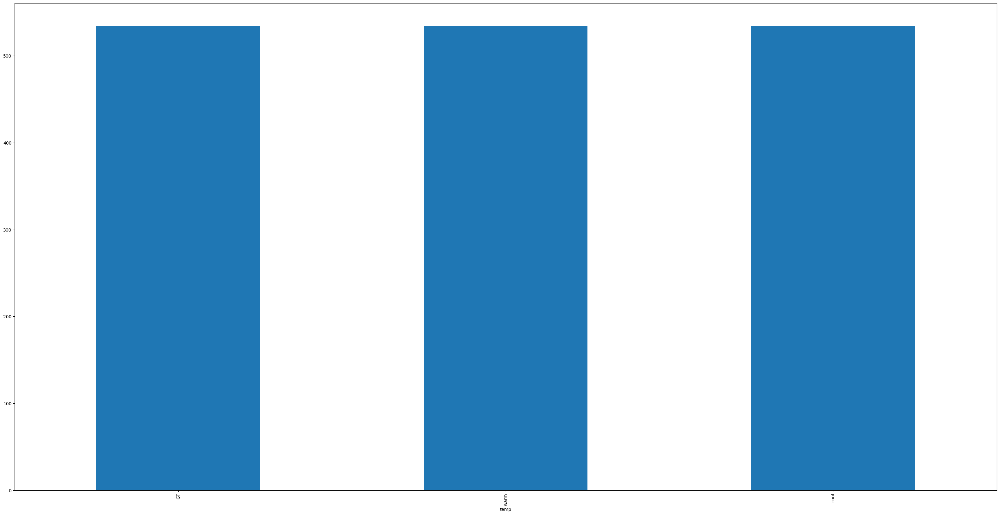

In [ ]:
#How many images are there of each temp
labels_csv["temp"].value_counts().plot.bar(figsize=(40,20))

In [ ]:
labels_csv["temp"].value_counts().median()

534.0

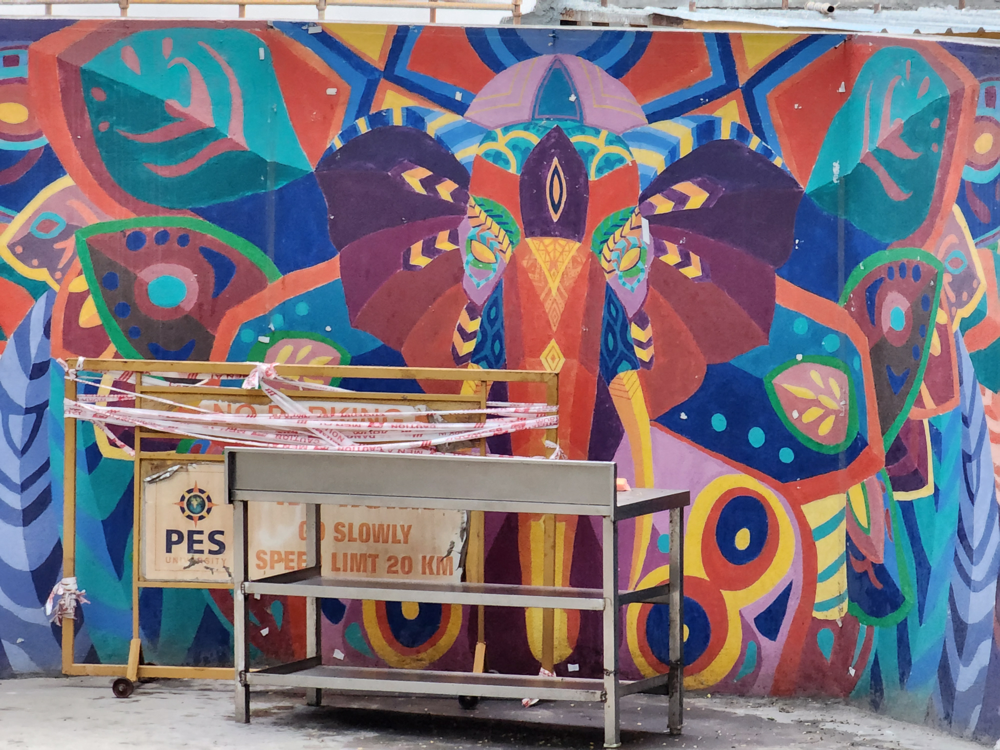

In [ ]:
#Viewing an image
from IPython.display import Image
Image("/content/drive/MyDrive/AWB/White Balance/train/GT-428.jpg")

In [ ]:
labels_csv.head()

,id,temp
0,GT-392.jpg,GT
1,GT-393.jpg,GT
2,GT-394.jpg,GT
3,GT-395.jpg,GT
4,GT-396.jpg,GT


In [ ]:
#Create pathnames from image IDs
filenames = ["/content/drive/MyDrive/AWB/White Balance/train/" +  fname for fname in labels_csv["id"]]

#Check the first 10

filenames[:10]

['/content/drive/MyDrive/AWB/White Balance/train/GT-392.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-393.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-394.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-395.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-396.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-397.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-398.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-399.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-400.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-401.jpg']

In [ ]:
#Check whether number of filenames matches actual image files
import os
if len(os.listdir("/content/drive/MyDrive/AWB/White Balance/train")) == len(filenames):
  print("The number of files match")
else:
  print("Filenames do not match actual amount of files")

The number of files match


In [ ]:
import os
actual = len(os.listdir("/content/drive/MyDrive/AWB/White Balance/train"))
fn = len(filenames)
print(actual)
print(fn)

1602
1602


In [ ]:
import numpy as np
labels = labels_csv["temp"]
labels = np.array(labels)
labels

array(['GT', 'GT', 'GT', ..., 'GT', 'GT', 'GT'], dtype=object)

In [ ]:
len(labels)

1602

In [ ]:
print(len(labels))
print(len(filenames))
if len(labels) == len(filenames):
  print("They are equal")
else:
  print("Not equal")

1602
1602
They are equal


In [ ]:
unique_temps = np.unique(labels)
len(unique_temps)
unique_temps

array(['GT', 'cool', 'warm'], dtype=object)

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_temps

GT


array([ True, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels = [label == unique_temps for label in labels] #runs above code for each of the values labels[1],labels[2]...
boolean_labels[:2]

[array([ True, False, False]), array([ True, False, False])]

In [ ]:
len(boolean_labels)

1602

In [ ]:
#Example: Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_temps == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # where will be a 1 where the sample label occurs

GT
(array([0]),)
0
[1 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))
print(boolean_labels[2].argmax());

GT
[1 0 0]
0


In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
NUM_IMAGES = 1000 # @param {type:"slider", min:200, max:1600, step:200}

In [ ]:
#let split our data into train and validation sets
from sklearn.model_selection import train_test_split
#split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)
#80% training set, 20% in validation set out of NUM_IMAGES

(800, 800, 200, 200)

In [ ]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[40])
image.shape

(2048, 1536, 3)

In [ ]:
image

array([[[154, 158, 161],
        [154, 158, 161],
        [157, 161, 164],
        ...,
        [ 67,  56,  50],
        [ 77,  66,  60],
        [ 79,  68,  62]],

       [[154, 158, 161],
        [154, 158, 161],
        [155, 159, 162],
        ...,
        [ 67,  56,  50],
        [ 72,  61,  55],
        [ 80,  69,  63]],

       [[152, 156, 159],
        [155, 159, 162],
        [154, 158, 161],
        ...,
        [ 73,  62,  56],
        [ 71,  60,  54],
        [ 62,  51,  45]],

       ...,

       [[  8,   6,  11],
        [ 13,  11,  16],
        [ 16,  14,  19],
        ...,
        [ 28,  39,  45],
        [ 37,  48,  54],
        [ 27,  38,  44]],

       [[  9,   7,  12],
        [ 21,  19,  24],
        [ 10,   8,  13],
        ...,
        [ 37,  46,  53],
        [ 31,  40,  47],
        [ 26,  35,  42]],

       [[ 12,  10,  15],
        [ 21,  19,  24],
        [  7,   5,  10],
        ...,
        [ 38,  47,  54],
        [ 55,  64,  71],
        [ 36,  43,  51]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[154, 158, 161],
        [154, 158, 161],
        [157, 161, 164],
        ...,
        [ 67,  56,  50],
        [ 77,  66,  60],
        [ 79,  68,  62]],

       [[154, 158, 161],
        [154, 158, 161],
        [155, 159, 162],
        ...,
        [ 67,  56,  50],
        [ 72,  61,  55],
        [ 80,  69,  63]]], dtype=uint8)

In [ ]:
tf.constant(image)
#image as tensor array

<tf.Tensor: shape=(2048, 1536, 3), dtype=uint8, numpy=
array([[[154, 158, 161],
        [154, 158, 161],
        [157, 161, 164],
        ...,
        [ 67,  56,  50],
        [ 77,  66,  60],
        [ 79,  68,  62]],

       [[154, 158, 161],
        [154, 158, 161],
        [155, 159, 162],
        ...,
        [ 67,  56,  50],
        [ 72,  61,  55],
        [ 80,  69,  63]],

       [[152, 156, 159],
        [155, 159, 162],
        [154, 158, 161],
        ...,
        [ 73,  62,  56],
        [ 71,  60,  54],
        [ 62,  51,  45]],

       ...,

       [[  8,   6,  11],
        [ 13,  11,  16],
        [ 16,  14,  19],
        ...,
        [ 28,  39,  45],
        [ 37,  48,  54],
        [ 27,  38,  44]],

       [[  9,   7,  12],
        [ 21,  19,  24],
        [ 10,   8,  13],
        ...,
        [ 37,  46,  53],
        [ 31,  40,  47],
        [ 26,  35,  42]],

       [[ 12,  10,  15],
        [ 21,  19,  24],
        [  7,   5,  10],
        ...,
        [ 38,  47, 

In [ ]:
IMG_SIZE = 224
#Create a function to preprocess images as tensor arrays

def process_image(image_path, img_size=IMG_SIZE):
  """
  takes an image file and turns the image into a tensor
  """
  #read in an image file
  image = tf.io.read_file(image_path) #returns a tensor of type string

  #Turn the jpeg image into numerical Tensor with 3 color channels(red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to (224,224)
  image=tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
#create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path and associated label, processes the image and returns
  a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
#demo of the above
(process_image(X[42]), tf.constant(y[42])) #Image and label pair

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3047819 , 0.23027213, 0.2459584 ],
         [0.31080434, 0.2284514 , 0.24805924],
         [0.3064426 , 0.22408965, 0.2436975 ],
         ...,
         [0.7372553 , 0.61166507, 0.32090905],
         [0.7727705 , 0.7145675 , 0.48117357],
         [0.7325531 , 0.64629865, 0.24988016]],
 
        [[0.3157463 , 0.24123651, 0.25692278],
         [0.31614646, 0.24163666, 0.25732294],
         [0.3137255 , 0.23137258, 0.2509804 ],
         ...,
         [0.70928395, 0.5902362 , 0.31456694],
         [0.7963597 , 0.76890874, 0.55340254],
         [0.7322732 , 0.63069266, 0.24621923]],
 
        [[0.31926772, 0.24475792, 0.2604442 ],
         [0.31484595, 0.24033615, 0.25602242],
         [0.32106844, 0.24655864, 0.2622449 ],
         ...,
         [0.6916384 , 0.57931364, 0.279034  ],
         [0.77144873, 0.72156864, 0.50258136],
         [0.71380496, 0.6092231 , 0.18327327]],
 
        ...,
 
        [[0.0579832 , 0.04677872

In [ ]:
#define batch size, 32 is a good start
BATCH_SIZE = 32
#Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size = BATCH_SIZE, valid_data = False, test_data= False):
  """
  Create batches of data out of image X and label y pairs
  Shuffles the data if it is training data doesnt shuffle if its validation data.
  Also accepts test data as input (no labels).
  """
  #If the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #from_tensor_slices=pass me some tensors, tf.data.Dataset = I'll create datasets out of that, tf.constant(X) = Turns X into tensors
    #^Only filespaths, no labels therefore we use process_image func

    data_batch = data.map(process_image).batch(BATCH_SIZE) #.batch converts data into specified batch size
    return data_batch

    #If the data is a valid dataset, we dont need to shuffle it

  elif valid_data:  #We are using images and labels in validation_data so use get_image_label func
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                                 tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                                 tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))


    data=data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)))

In [ ]:
#Visualizing Data Batches
import matplotlib.pyplot as plt
#Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  for i in range(25):
    #Create subplots
    ax = plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_temps[labels[i].argmax()])
    #turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[7.58143306e-01, 6.55942380e-01, 5.09743929e-01],
          [5.13285398e-01, 4.32553053e-01, 3.11324537e-01],
          [6.89715922e-01, 5.78611493e-01, 4.69847977e-01],
          ...,
          [7.80711845e-02, 4.86600995e-02, 1.01843923e-02],
          [6.78469166e-02, 5.79834022e-02, 7.40293274e-03],
          [6.38639107e-02, 6.72263503e-02, 1.99689239e-05]],
 
         [[7.24869967e-01, 6.26610637e-01, 5.09623885e-01],
          [7.48179257e-01, 6.57983184e-01, 5.34253716e-01],
          [6.69747889e-01, 5.79551816e-01, 4.54901993e-01],
          ...,
          [5.60437180e-02, 6.58459216e-02, 9.82419867e-03],
          [6.64864331e-02, 5.73230945e-02, 1.09243700e-02],
          [7.79709965e-02, 4.52184044e-02, 7.84313772e-03]],
 
         [[4.90116119e-01, 4.08603489e-01, 3.59103680e-01],
          [6.82312965e-01, 6.08403385e-01, 4.92396981e-01],
          [7.18927562e-01, 6.32553041e-01, 5.33733547e-01],
          ...,
          [5.26600480e-02, 4.88006696e-02, 1.1665

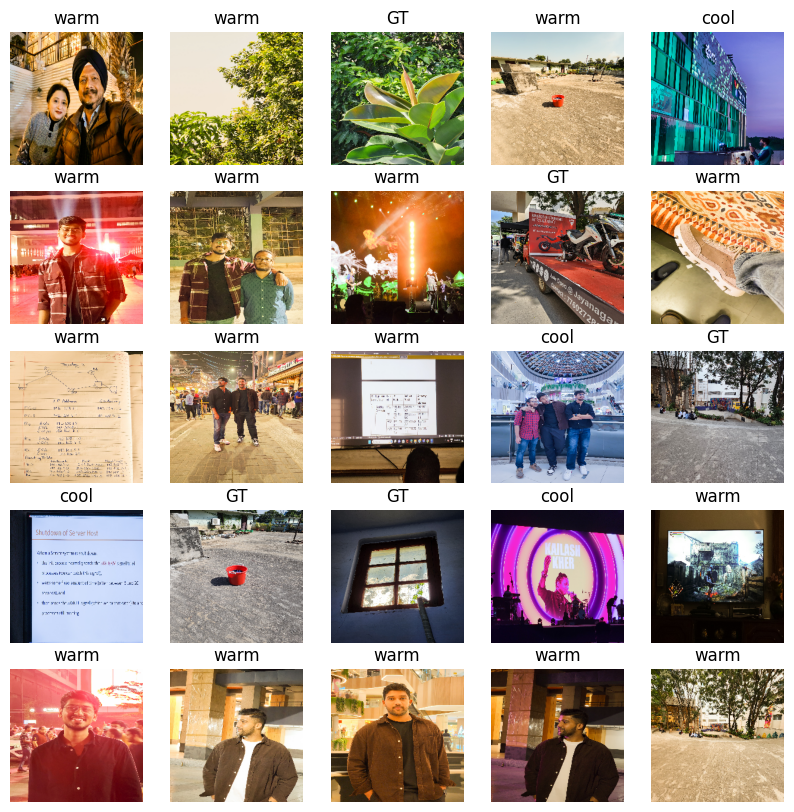

In [ ]:
show_25_images(train_images, train_labels)

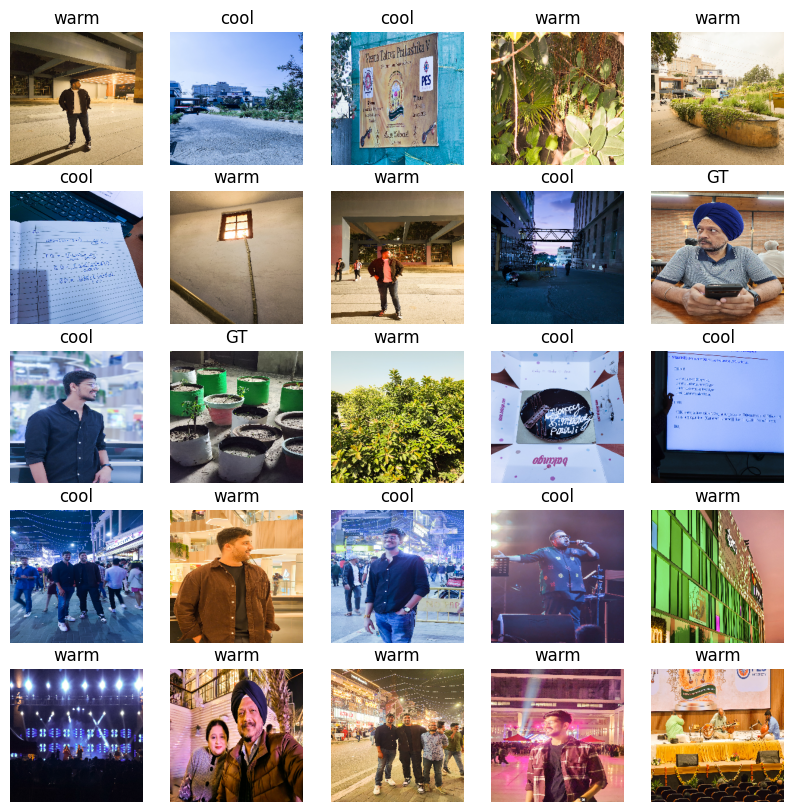

In [ ]:
#Visualizing validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)



Building a model efore we build a model, there are a few things we need to define:

    The input shape(out images shape, in the form of tensors) to out model.
    The output shape(image labels, in the form of tensors) of our model.
    The URL of the model we want to use.



In [ ]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_temps)

#Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"




Now weve got out inputs, outputs and model ready to go. Lets put them together into a keras deep learning model

Knowing this, lets create a function which:

    Takes input, output shape and the model weve choosen as parameters.
    Defines the layers in a keras model in sequential fashion(step 1, step 2, step 3...)
    Compiles the model
    Builds the model
    Returns the model



In [ ]:
#Create a function which builds a keras model

def create_model(input_shape=INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)

  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  #Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") #Layer 2 (output layer)
  ])


  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 3)                 3006      
                                                                 
Total params: 5435719 (20.74 MB)
Trainable params: 3006 (11.74 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


Callbacks: Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop trainging early if a model stops improving. Creating 2 callbacks, one for tensorboard and one for early stopping to avoid overfitting



To setup a TensorFlow callback, we need to do 3 things:

    Load the tensorboard notebook extension
    Create a TensorBoard callback which is able to save logs to a adirectory and pass it to out model's fit() function
    Visualize our models training logs with the tensorboard magic function.



In [ ]:
#Lets implement TensorBoard callback
#Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/AWB/White Balance/logs',
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


Early Stopping Callback

Helps stop out model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)#Stop training if model stops improving over 3 epochs


Training a model(subset of data)

Our first model is only going to train on 1000 images, for speed and time's sake

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10,max:100,step:10}


In [ ]:
print("GPU","AVAILABLE" if tf.config.list_physical_devices("GPU") else "not available")

GPU AVAILABLE




Create a function that creates a model

    Create a model using create_model().
    Setup a TensorBoard callback using create_tensorboard_callback().
    Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use.
    Return the model.



In [ ]:
#Build a function to train and return a trained model
def train_model():
  """
  trains a given model and return the trained version.
  """
  #Create a model
  model = create_model()

  #Create new TENSORBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it to the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,    #Once per epoch
            callbacks=[tensorboard, early_stopping])
  #return the fitted model
  return model

In [ ]:
  #Fit the model to the data

  #model = train_model()

In [ ]:

%tensorboard --logdir /content/drive/MyDrive/AWB/White\ Balance/logs

Reusing TensorBoard on port 6006 (pid 3922), started 0:17:57 ago. (Use '!kill 3922' to kill it.)

<IPython.core.display.Javascript object>

Making and evaluating predictions using a trained model

In [ ]:
#Make predictions on the validation data(not used to train on)

predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 10s 1s/step


array([[6.08714998e-01, 2.00240925e-01, 1.91044062e-01],
       [8.70156050e-01, 1.43618807e-02, 1.15481995e-01],
       [7.92309880e-01, 1.25040233e-01, 8.26497972e-02],
       [6.50965452e-01, 2.45246530e-01, 1.03788018e-01],
       [6.38063192e-01, 2.35668719e-01, 1.26268119e-01],
       [1.52897999e-01, 7.91072011e-01, 5.60300574e-02],
       [6.72865212e-01, 3.24467838e-01, 2.66700168e-03],
       [7.00934589e-01, 2.26588055e-01, 7.24773705e-02],
       [8.11456621e-01, 1.50920391e-01, 3.76229882e-02],
       [5.78699827e-01, 1.49226069e-01, 2.72074103e-01],
       [3.15955013e-01, 2.29541659e-01, 4.54503328e-01],
       [3.16259742e-01, 1.83790699e-01, 4.99949574e-01],
       [7.66491175e-01, 1.81071594e-01, 5.24372905e-02],
       [4.39733155e-02, 4.36475724e-02, 9.12379146e-01],
       [2.58240044e-01, 7.24640727e-01, 1.71192437e-02],
       [9.18094292e-02, 8.13081324e-01, 9.51092765e-02],
       [2.87182570e-01, 2.76875049e-01, 4.35942411e-01],
       [4.29313838e-01, 3.67228

In [ ]:
predictions.shape

(200, 3)

In [ ]:
len(y_val)

200

In [ ]:
len((unique_temps))

3

In [ ]:
len(predictions[0])

3

In [ ]:
#First prediction
index=0
print(predictions[0])
print(f"Max vslue (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_temps[np.argmax(predictions[index])]}")

[0.608715   0.20024092 0.19104406]
Max vslue (probability of prediction): 0.6087149977684021
Sum: 1.0
Max index: 0
Predicted label: GT


In [ ]:
#Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_temps[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of array prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'GT'

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_temps[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.19781914, 0.17821129, 0.10342138],
         [0.19847941, 0.19063628, 0.10660265],
         [0.21690679, 0.19729894, 0.11886757],
         ...,
         [0.35314143, 0.2433375 , 0.09823945],
         [0.3485197 , 0.2387158 , 0.09361774],
         [0.37112853, 0.25264114, 0.11174477]],
 
        [[0.24199682, 0.21510607, 0.14031614],
         [0.21204486, 0.19243702, 0.11400565],
         [0.1907563 , 0.17064826, 0.10004002],
         ...,
         [0.35088024, 0.2410763 , 0.09597826],
         [0.3819916 , 0.27050644, 0.126249  ],
         [0.29357785, 0.18909605, 0.06040417]],
 
        [[0.2456583 , 0.22212888, 0.13585436],
         [0.26564628, 0.24211687, 0.15584235],
         [0.24071631, 0.2171869 , 0.12306924],
         ...,
         [0.37945113, 0.26964718, 0.12454912],
         [0.3779296 , 0.26028252, 0.11910602],
         [0.379752  , 0.2618249 , 0.1293317 ]],
 
        ...,
 
        [[0.6697665 , 0.5679057 , 0.36760566],
         [0.6895362 , 0.5917761 , 0.39317

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.bool, name=None))>

In [ ]:
predictions[81]

array([0.849765  , 0.13728547, 0.01294961], dtype=float32)



Ceate a function which:

    Takes an array od predictions probabilities, an array of truth labels and an array of images and an integer.
    Convert prediciton probabilities to a predicted label.
    Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.



In [ ]:
def plot_pred(predicition_probabilities, labels, images , n=1):
  """
  """
  pred_prob, true_label, image=predicition_probabilities[n],labels[n], images[n]
  #Get the pred label
  pred_label = get_pred_label(pred_prob)
  #plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color="green"
  else:
    color = "red"

  #Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                              np.max(pred_prob)*100,
                              true_label),
                              color=color)
  pass

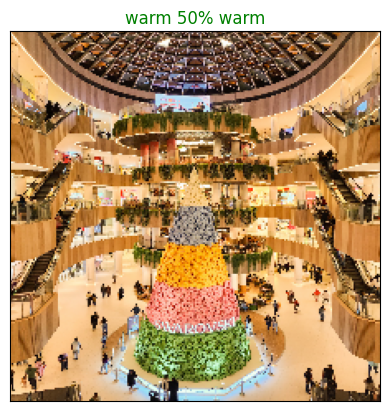

In [ ]:
plot_pred(predicition_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Saving and reloading a model

In [ ]:
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix
  """
  #Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/AWB/White Balance/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:  {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

saving and loading a model

In [ ]:
save_model(model, suffix = "AWB-images-MobileNetv2")

Saving model to: /content/drive/MyDrive/AWB/White Balance/models/20240422-20081713816534-AWB-images-MobileNetv2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/AWB/White Balance/models/20240422-20081713816534-AWB-images-MobileNetv2.h5'

Loading

In [ ]:
loaded_AWB_Model = load_model('/content/drive/MyDrive/AWB/White Balance/models/20240422-20041713816263-AWB-images-MobileNetv2.h5')

Loading saved model from:  /content/drive/MyDrive/AWB/White Balance/models/20240422-20041713816263-AWB-images-MobileNetv2.h5


In [ ]:
#Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 11s 1s/step - loss: 2.0130 - accuracy: 0.3050


[2.012993574142456, 0.3050000071525574]

In [ ]:
loaded_AWB_Model.evaluate(val_data)

7/7 [==============================] - 11s 1s/step - loss: 2.0130 - accuracy: 0.3050


[2.012993574142456, 0.3050000071525574]

Training with full dataset

In [ ]:
len(X), len(y)

(1602, 1602)

In [ ]:
X[:10]

['/content/drive/MyDrive/AWB/White Balance/train/GT-392.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-393.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-394.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-395.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-396.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-397.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-398.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-399.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-400.jpg',
 '/content/drive/MyDrive/AWB/White Balance/train/GT-401.jpg']

In [ ]:
len(X_train)

800

In [ ]:
#Create a data batch with the full data sset
full_data = create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
#Build on full data set
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
51/51 [==============================] - 87s 2s/step - loss: 1.2501 - accuracy: 0.4638
Epoch 2/100
51/51 [==============================] - 82s 2s/step - loss: 0.7178 - accuracy: 0.6873
Epoch 3/100
51/51 [==============================] - 81s 2s/step - loss: 0.5947 - accuracy: 0.7528
Epoch 4/100
51/51 [==============================] - 80s 2s/step - loss: 0.5000 - accuracy: 0.7990
Epoch 5/100
51/51 [==============================] - 81s 2s/step - loss: 0.4668 - accuracy: 0.8059
Epoch 6/100
51/51 [==============================] - 80s 2s/step - loss: 0.4252 - accuracy: 0.8383
Epoch 7/100
51/51 [==============================] - 79s 2s/step - loss: 0.3892 - accuracy: 0.8602
Epoch 8/100
51/51 [==============================] - 79s 2s/step - loss: 0.3663 - accuracy: 0.8652
Epoch 9/100
51/51 [==============================] - 79s 2s/step - loss: 0.3397 - accuracy: 0.8708
Epoch 10/100
51/51 [==============================] - 79s 2s/step - loss: 0.3280 - accuracy: 0.8789
Epoch 11/

In [ ]:
save_model(full_model, suffix="full-set-mobilenetv2-AWB")

Saving model to: /content/drive/MyDrive/AWB/White Balance/models/20240422-21301713821411-full-set-mobilenetv2-AWB.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/AWB/White Balance/models/20240422-21301713821411-full-set-mobilenetv2-AWB.h5'

In [ ]:
import tensorflow as tf
loaded_full_model_awb = load_model('/content/drive/MyDrive/AWB/White Balance/models/20240422-21301713821411-full-set-mobilenetv2-AWB.h5')

Loading saved model from:  /content/drive/MyDrive/AWB/White Balance/models/20240422-21301713821411-full-set-mobilenetv2-AWB.h5


In [ ]:
import tensorflow as tf
converter = tf.lite.TFLiteConverter.from_keras_model(loaded_full_model_awb)

In [ ]:
tflite_model = converter.convert()

In [ ]:
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)